# Experimental Results Exploration

This notebook systematically explores all results from the experimental pipeline:
1. **Causal Discovery Results**: PC and LiNGAM performance vs ground truth
2. **Predictive Model Performance**: LGBM and Neural Network metrics
3. **Shapley Value Method Comparisons**: Compare how different explainability methods differ across causal discovery algorithms
4. **SHAP Dependence Plots**: Visualize SHAP values vs feature values for top features

**Datasets analyzed**: 6 synthetic systems
- Linear (no confounders)
- Linear (with confounders)
- Nonlinear (no confounders)
- Nonlinear (with confounders)
- Mixed (no confounders)
- Mixed (with confounders)

In [7]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from IPython.display import Image, display, Markdown
import warnings
warnings.filterwarnings('ignore')

# Configure matplotlib
sns.set_theme(style="darkgrid", palette="husl")
%matplotlib inline

# Directories
BASE_DIR = Path('/Users/juanrios/Documents/master_thesis')
DATA_DIR = BASE_DIR / 'data'
SYNTHETIC_DIR = DATA_DIR / 'synthetic'
PROCESSED_DIR = DATA_DIR / 'processed'
CAUSAL_DIR = DATA_DIR / 'causal'
EXPLAINABILITY_DIR = DATA_DIR / 'explainability'
MODELS_DIR = BASE_DIR / 'models'

# Dataset configurations
DATASETS = [
    'linear_no_conf_f10_s500_p50',
    'linear_conf_f10_s500_p50',
    'nonlinear_no_conf_f10_s500_p50',
    'nonlinear_conf_f10_s500_p50',
    'mixed_no_conf_f10_s500_p50',
    'mixed_conf_f10_s500_p50'
]

CAUSAL_METHODS = ['pc', 'lingam']
PREDICTIVE_MODELS = ['lgbm', 'nn']
SHAPLEY_METHODS = ['scratch', 'asymmetric', 'causal', 'flow']

print("✅ Setup complete!")

✅ Setup complete!


---
## 1. Causal Discovery Results

Compare PC and LiNGAM performance against ground truth causal graphs.

In [8]:
def load_causal_comparison(dataset, method):
    """Load causal discovery comparison metrics."""
    comparison_path = CAUSAL_DIR / f"{dataset}_{method}_comparison.json"
    if comparison_path.exists():
        with open(comparison_path, 'r') as f:
            return json.load(f)
    return None

# Collect all causal discovery metrics
causal_results = []
for dataset in DATASETS:
    for method in CAUSAL_METHODS:
        metrics = load_causal_comparison(dataset, method)
        if metrics:
            causal_results.append({
                'dataset': dataset,
                'method': method.upper(),
                'precision': metrics.get('precision', None),
                'recall': metrics.get('recall', None),
                'f1_score': metrics.get('f1_score', None),
                'shd': metrics.get('structural_hamming_distance', None)
            })

# Create summary DataFrame
causal_df = pd.DataFrame(causal_results)
display(Markdown("### Causal Discovery Performance Summary"))
display(causal_df.round(3))

### Causal Discovery Performance Summary

,dataset,method,precision,recall,f1_score,shd
0,linear_no_conf_f10_s500_p50,PC,0.306,0.478,0.373,37
1,linear_no_conf_f10_s500_p50,LINGAM,0.205,0.348,0.258,46
2,linear_conf_f10_s500_p50,PC,0.312,0.435,0.364,35
3,linear_conf_f10_s500_p50,LINGAM,0.293,0.522,0.375,40
4,nonlinear_no_conf_f10_s500_p50,PC,0.386,0.739,0.507,33
5,nonlinear_no_conf_f10_s500_p50,LINGAM,0.120,0.130,0.125,42
6,nonlinear_conf_f10_s500_p50,PC,0.361,0.565,0.441,33
7,nonlinear_conf_f10_s500_p50,LINGAM,0.462,0.522,0.490,25
8,mixed_no_conf_f10_s500_p50,PC,0.237,0.391,0.295,43
9,mixed_no_conf_f10_s500_p50,LINGAM,0.231,0.130,0.167,30


---
## 2. Predictive Model Performance

Compare LGBM and Neural Network regression performance.

In [9]:
def load_model_metrics(dataset):
    """Load predictive model metrics."""
    metrics_path = MODELS_DIR / f"{dataset}_metrics.json"
    if metrics_path.exists():
        with open(metrics_path, 'r') as f:
            return json.load(f)
    return None

# Collect all model metrics
model_results = []
for dataset in DATASETS:
    metrics = load_model_metrics(dataset)
    if metrics:
        for model_name in ['lgbm', 'nn']:        
            model_results.append({
                'dataset': dataset,
                'model': model_name.upper(),
                'r2': metrics[model_name].get('r2', None),
                'mae': metrics[model_name].get('mae', None),
                'mse': metrics[model_name].get('mse', None),
                'rmse': np.sqrt(metrics[model_name].get('mse', None)) if metrics[model_name].get('mse', None) is not None else None
            })

# Create summary DataFrame
model_df = pd.DataFrame(model_results)
display(Markdown("### Predictive Model Performance Summary"))
display(model_df.round(4))

### Predictive Model Performance Summary

,dataset,model,r2,mae,mse,rmse
0,linear_no_conf_f10_s500_p50,LGBM,0.9422,0.6546,0.6719,0.8197
1,linear_no_conf_f10_s500_p50,NN,0.9718,0.4555,0.3282,0.5729
2,linear_conf_f10_s500_p50,LGBM,0.9363,0.6880,1.0995,1.0486
3,linear_conf_f10_s500_p50,NN,0.9794,0.4574,0.3549,0.5957
4,nonlinear_no_conf_f10_s500_p50,LGBM,0.7849,0.4988,0.4185,0.6469
5,nonlinear_no_conf_f10_s500_p50,NN,0.7117,0.5799,0.5611,0.7491
6,nonlinear_conf_f10_s500_p50,LGBM,0.7481,0.5780,0.7554,0.8691
7,nonlinear_conf_f10_s500_p50,NN,0.6292,0.6473,1.1120,1.0545
8,mixed_no_conf_f10_s500_p50,LGBM,0.8820,0.8319,1.4920,1.2215
9,mixed_no_conf_f10_s500_p50,NN,0.8879,0.8415,1.4168,1.1903


---
## 3. Cross-Method SHAP Value Comparisons

Compare how different explainability methods (Asymmetric, Causal, Flow) differ from the baseline (Scratch).

In [10]:
def load_method_comparison(dataset, model, discovery_method):
    """Load method comparison metrics."""
    comparison_path = EXPLAINABILITY_DIR / dataset / model / discovery_method / 'method_comparison.json'
    if comparison_path.exists():
        with open(comparison_path, 'r') as f:
            return json.load(f)
    return None

# Collect cross-method comparison metrics
comparison_results = []
for dataset in DATASETS:
    for model in PREDICTIVE_MODELS:
        for causal_method in CAUSAL_METHODS:
            metrics = load_method_comparison(dataset, model, causal_method)
            if metrics:
                for shap_method in ['Asymmetric', 'Causal', 'Flow']:
                    if shap_method in metrics:
                        comparison_results.append({
                            'dataset': dataset,
                            'model': model.upper(),
                            'causal_discovery': causal_method.upper(),
                            'shapley_method': shap_method,
                            'correlation_with_scratch': metrics[shap_method].get('correlation_with_scratch'),
                            'rank_correlation': metrics[shap_method].get('rank_correlation'),
                            'mae_vs_scratch': metrics[shap_method].get('mae_vs_scratch')
                        })

comparison_df = pd.DataFrame(comparison_results)
display(Markdown("### Cross-Method Comparison (vs Scratch Baseline)"))
display(comparison_df.round(4))

### Cross-Method Comparison (vs Scratch Baseline)

,dataset,model,causal_discovery,shapley_method,correlation_with_scratch,rank_correlation,mae_vs_scratch
0,linear_no_conf_f10_s500_p50,LGBM,PC,Asymmetric,None,None,None
1,linear_no_conf_f10_s500_p50,LGBM,PC,Causal,None,None,None
2,linear_no_conf_f10_s500_p50,LGBM,PC,Flow,None,None,None
3,linear_no_conf_f10_s500_p50,LGBM,LINGAM,Asymmetric,None,None,None
4,linear_no_conf_f10_s500_p50,LGBM,LINGAM,Causal,None,None,None
...,...,...,...,...,...,...,...
67,mixed_conf_f10_s500_p50,NN,PC,Causal,None,None,None
68,mixed_conf_f10_s500_p50,NN,PC,Flow,None,None,None
69,mixed_conf_f10_s500_p50,NN,LINGAM,Asymmetric,None,None,None
70,mixed_conf_f10_s500_p50,NN,LINGAM,Causal,None,None,None


UnboundLocalError: cannot access local variable 'boxprops' where it is not associated with a value

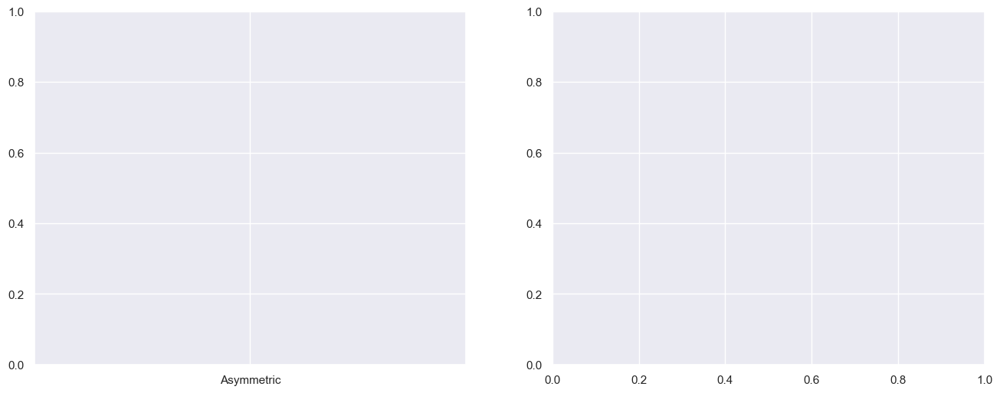

In [11]:
# Visualize correlation with baseline across methods
if len(comparison_df) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Correlation with Scratch by Shapley Method
    sns.boxplot(data=comparison_df, x='shapley_method', y='correlation_with_scratch', 
                hue='causal_discovery', ax=axes[0], legend=False)
    axes[0].set_title('SHAP Value Correlation with Baseline (Scratch)', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Shapley Method', fontsize=12)
    axes[0].set_ylabel('Correlation with Scratch', fontsize=12)
    axes[0].legend(title='Causal Discovery')
    axes[0].grid(alpha=0.3)
    
    # Plot 2: Rank Correlation
    sns.boxplot(data=comparison_df, x='shapley_method', y='rank_correlation', 
                hue='causal_discovery', ax=axes[1], legend=False)
    axes[1].set_title('Feature Importance Rank Correlation', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Shapley Method', fontsize=12)
    axes[1].set_ylabel('Spearman Rank Correlation', fontsize=12)
    axes[1].legend(title='Causal Discovery')
    axes[1].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

---
## 4. SHAP Values vs Feature Values  

**Key Analysis**: Visualize SHAP values against actual feature values for the top 5 most important features.  
This shows how each explainability method interprets the relationship between features and predictions.

In [12]:
def plot_shap_dependence_comparison(dataset, model, causal_discovery_method, n_features=5):
    """
    Plot SHAP values vs feature values for top N features, comparing different explainability methods.
    
    Parameters:
    -----------
    dataset : str
        Dataset name
    model : str  
        Model name ('lgbm' or 'nn')
    causal_discovery_method : str
        Causal discovery method ('pc' or 'lingam')
    n_features : int
        Number of top features to plot
    """
    # Load test data
    test_path = PROCESSED_DIR / f"{dataset}_test.parquet"
    if not test_path.exists():
        print(f"❌ Test data not found for {dataset}")
        return
    
    test_data = pd.read_parquet(test_path)
    X_test = test_data.drop(columns=['Y'])
    
    # Load SHAP values for all methods
    shap_values_dict = {}
    methods = ['scratch', 'asymmetric', 'causal', 'flow']
    method_paths = {
        'scratch': EXPLAINABILITY_DIR / dataset / model / 'scratch',
        'asymmetric': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'asymmetric',
        'causal': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'causal',
        'flow': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'flow'
    }
    
    for method_name, method_path in method_paths.items():
        shap_file = method_path / 'shapley_values.npy'
        if shap_file.exists():
            shap_values_dict[method_name] = np.load(shap_file)
        else:
            print(f"⚠️  SHAP values not found: {shap_file}")
    
    if not shap_values_dict:
        print(f"❌ No SHAP values found for {dataset} / {model} / {causal_discovery_method}")
        return
    
    # Determine top N features based on mean absolute SHAP values from scratch method
    if 'scratch' in shap_values_dict:
        baseline_importance = np.abs(shap_values_dict['scratch']).mean(axis=0)
    else:
        # Use first available method
        first_method = list(shap_values_dict.keys())[0]
        baseline_importance = np.abs(shap_values_dict[first_method]).mean(axis=0)
    
    top_features = np.argsort(baseline_importance)[-n_features:][::-1]
    feature_names = X_test.columns.tolist()
    
    # Get the subset of test instances that match SHAP values shape
    n_instances = list(shap_values_dict.values())[0].shape[0]
    X_subset = X_test.iloc[:n_instances]
    
    # Create plots
    n_methods = len(shap_values_dict)
    fig, axes = plt.subplots(n_features, n_methods, figsize=(5*n_methods, 4*n_features))
    
    if n_features == 1:
        axes = axes.reshape(1, -1)
    if n_methods == 1:
        axes = axes.reshape(-1, 1)
    
    colors = plt.cm.viridis(np.linspace(0, 1, n_methods))
    
    for feat_idx, feature_pos in enumerate(top_features):
        feature_name = feature_names[feature_pos]
        feature_values = X_subset.iloc[:, feature_pos].values
        
        for method_idx, (method_name, shap_vals) in enumerate(shap_values_dict.items()):
            ax = axes[feat_idx, method_idx]
            
            # SHAP values for this feature
            shap_feature = shap_vals[:, feature_pos]
            
            # Scatter plot
            ax.scatter(feature_values, shap_feature, alpha=0.5, s=20, 
                      c=colors[method_idx], edgecolors='black', linewidth=0.5)
            
            # Add trend line
            z = np.polyfit(feature_values, shap_feature, 1)
            p = np.poly1d(z)
            ax.plot(sorted(feature_values), p(sorted(feature_values)), 
                   "r--", alpha=0.8, linewidth=2)
            
            # Labels
            if feat_idx == 0:
                ax.set_title(f"{method_name.upper()}\n", fontsize=14, fontweight='bold')
            
            if method_idx == 0:
                ax.set_ylabel(f"{feature_name}\nSHAP Value", fontsize=11, fontweight='bold')
            else:
                ax.set_ylabel('SHAP Value', fontsize=10)
            
            if feat_idx == n_features - 1:
                ax.set_xlabel('Feature Value', fontsize=10)
            
            ax.axhline(y=0, color='gray', linestyle='-', linewidth=0.8, alpha=0.5)
            ax.grid(alpha=0.3, linestyle='--')
            
            # Add correlation coefficient
            corr = np.corrcoef(feature_values, shap_feature)[0, 1]
            ax.text(0.05, 0.95, f'r={corr:.3f}', transform=ax.transAxes,
                   fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    fig.suptitle(f'SHAP Dependence Plots: {dataset}\nModel: {model.upper()}, Causal Discovery: {causal_discovery_method.upper()}',
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    
    return fig

### Example: Linear Dataset without Confounders

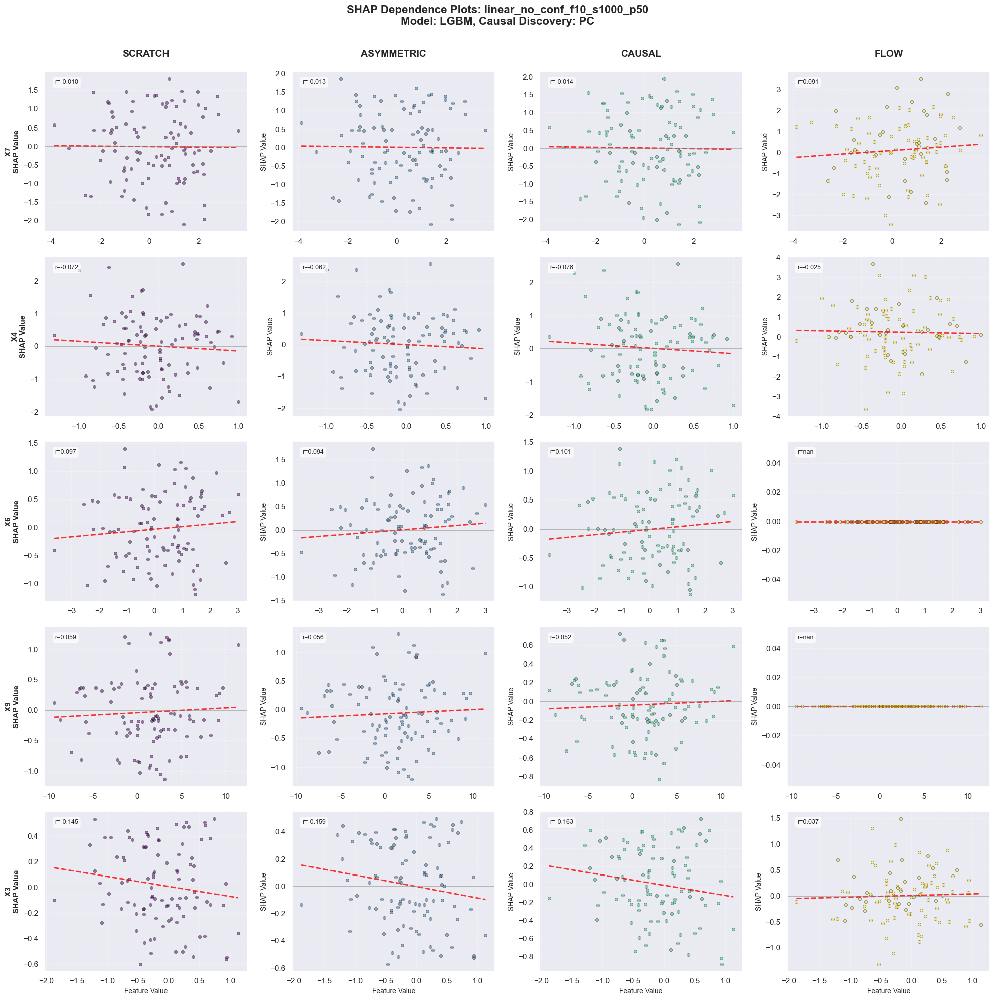

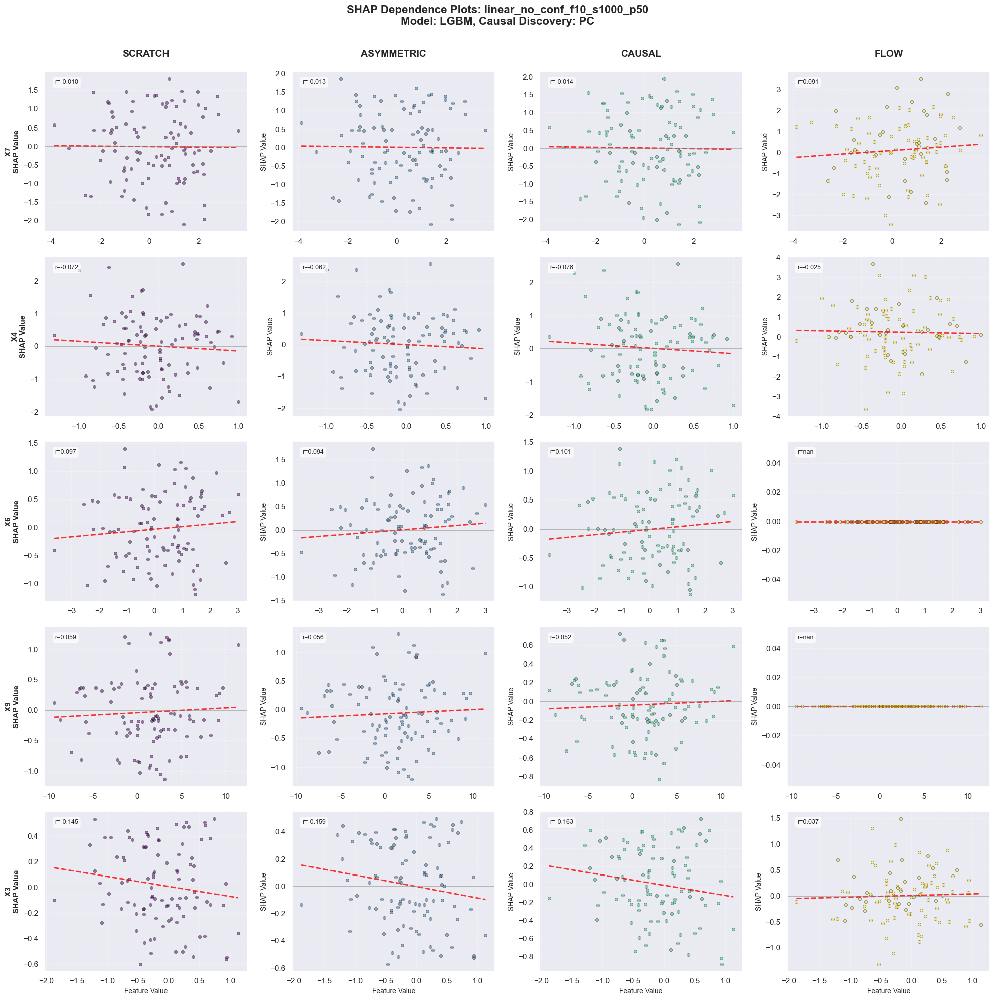

In [13]:
# Example: Compare methods on linear dataset with LGBM and PC
plot_shap_dependence_comparison(
    dataset='linear_no_conf_f10_s1000_p50',
    model='lgbm',
    causal_discovery_method='pc',
    n_features=5
)

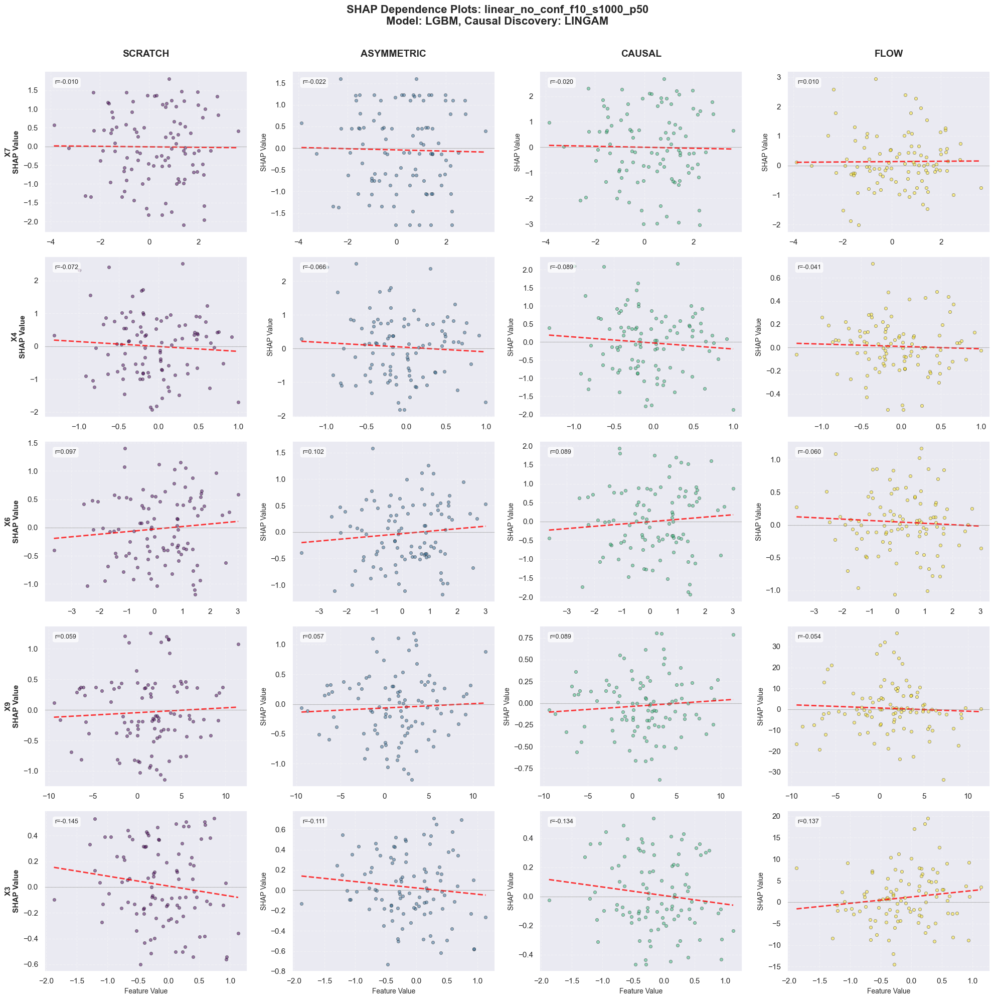

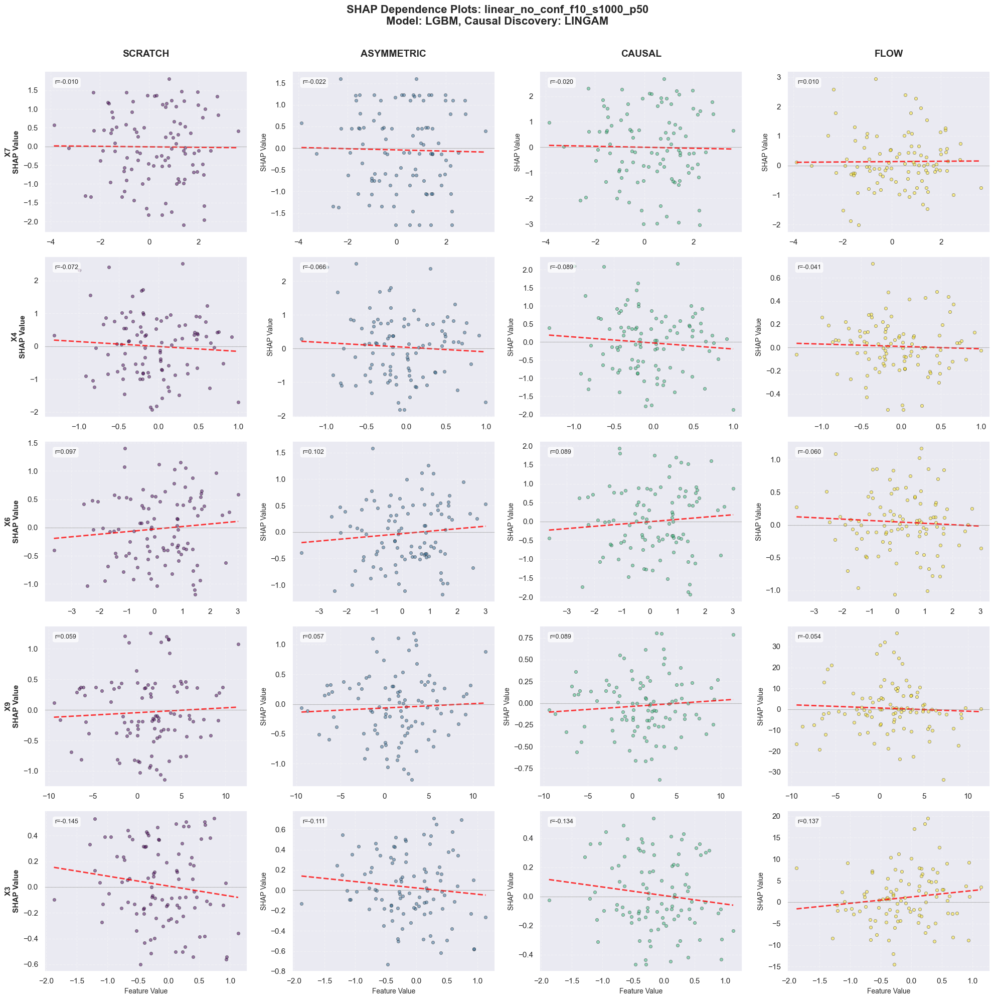

In [14]:
# Example: Compare methods on linear dataset with LGBM and PC
plot_shap_dependence_comparison(
    dataset='linear_no_conf_f10_s1000_p50',
    model='lgbm',
    causal_discovery_method='lingam',
    n_features=5
)

### Iterate Through All Combinations


Dataset: linear_no_conf_f10_s500_p50

📊 LGBM + PC


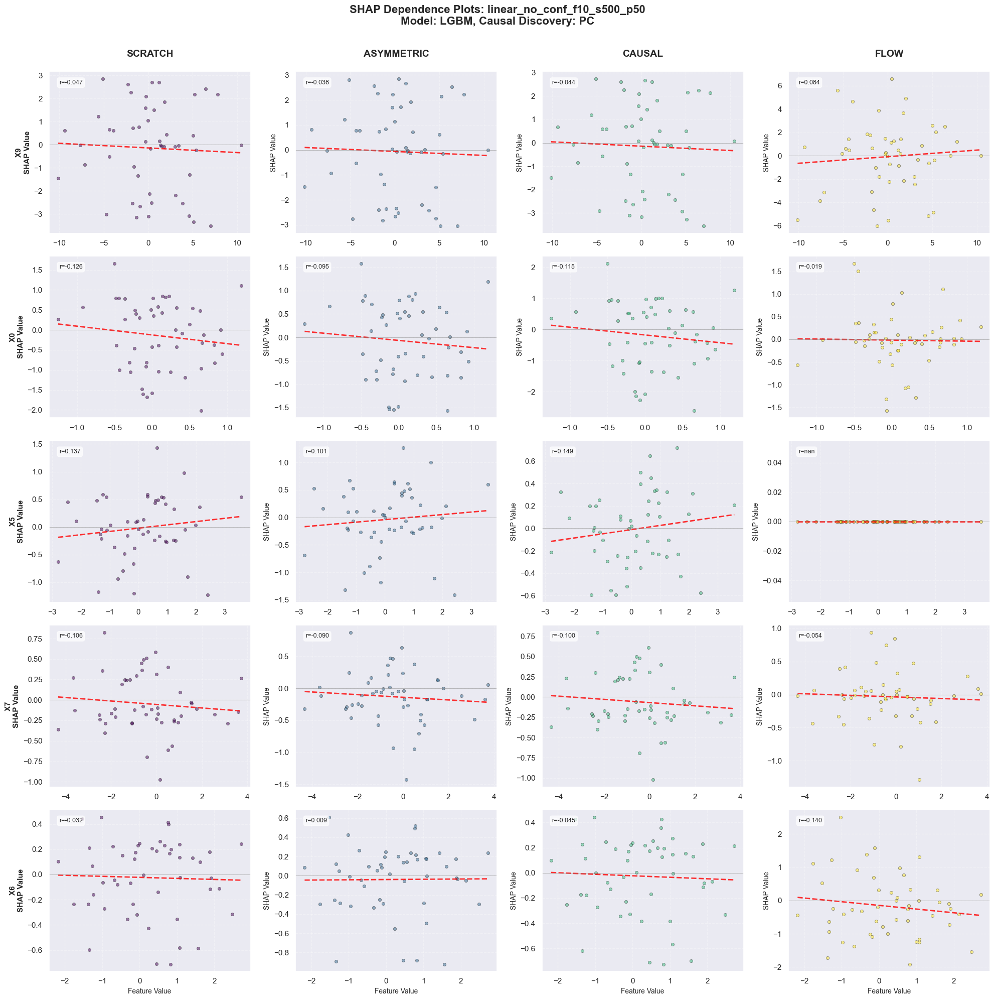


📊 LGBM + LINGAM


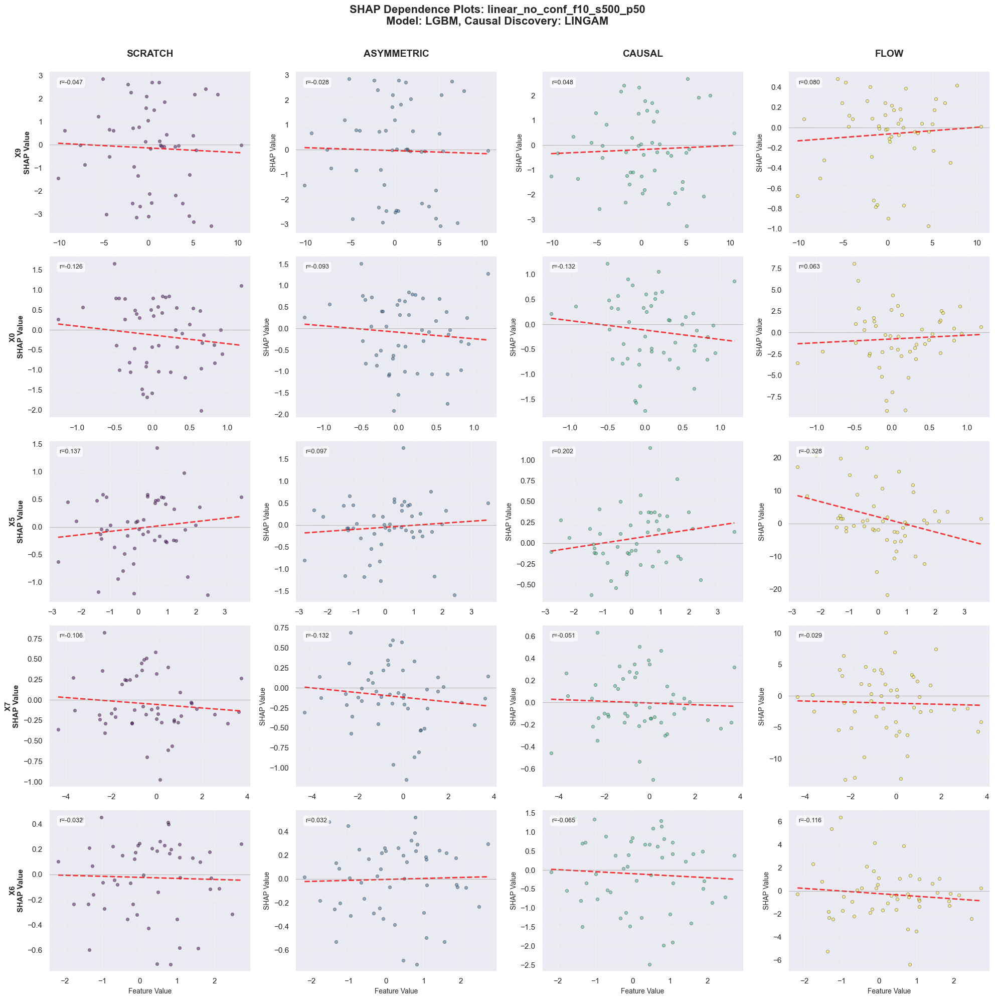


📊 NN + PC


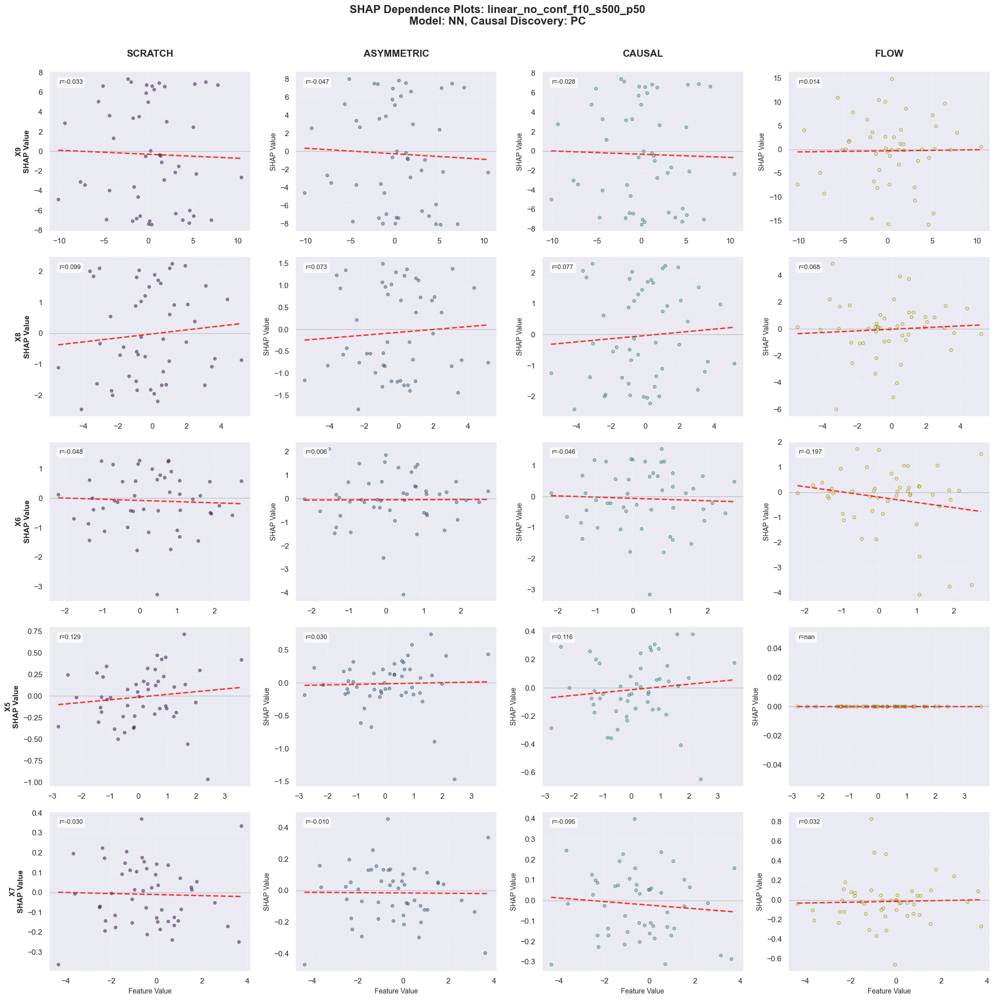


📊 NN + LINGAM


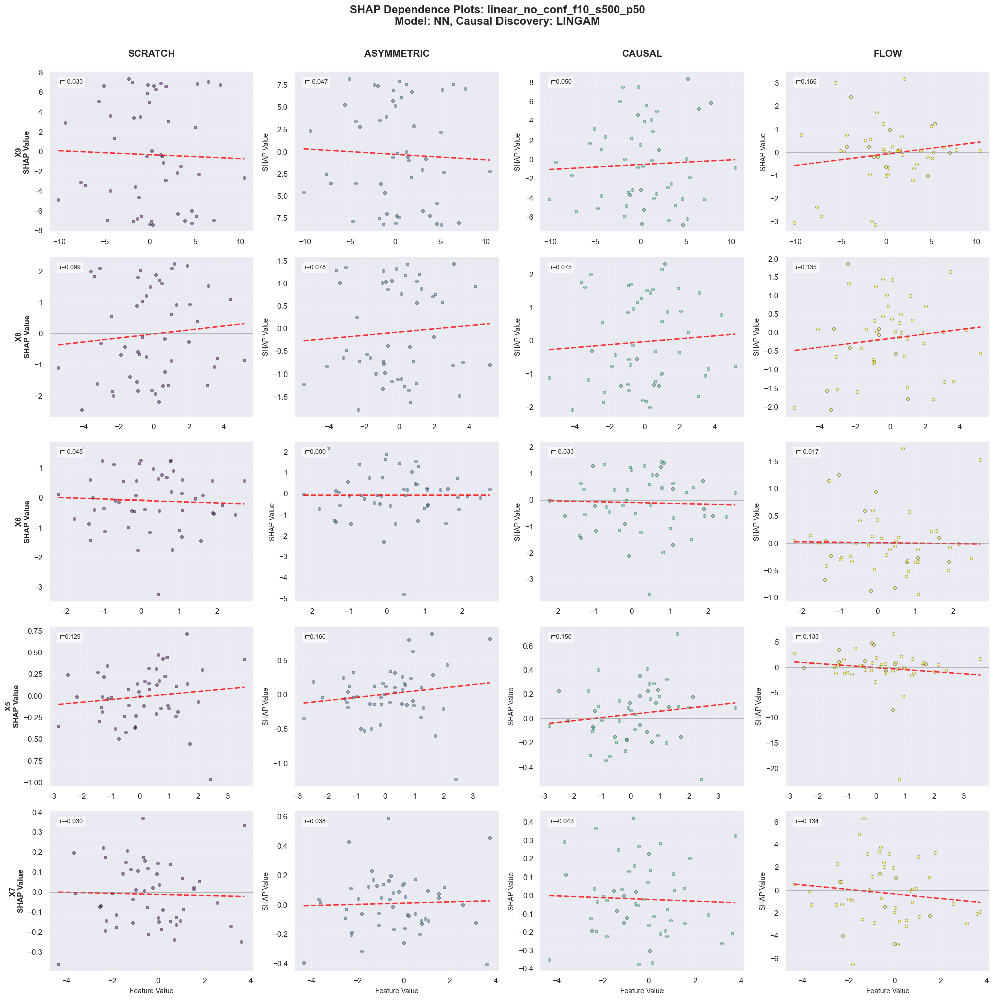


Dataset: linear_conf_f10_s500_p50

📊 LGBM + PC


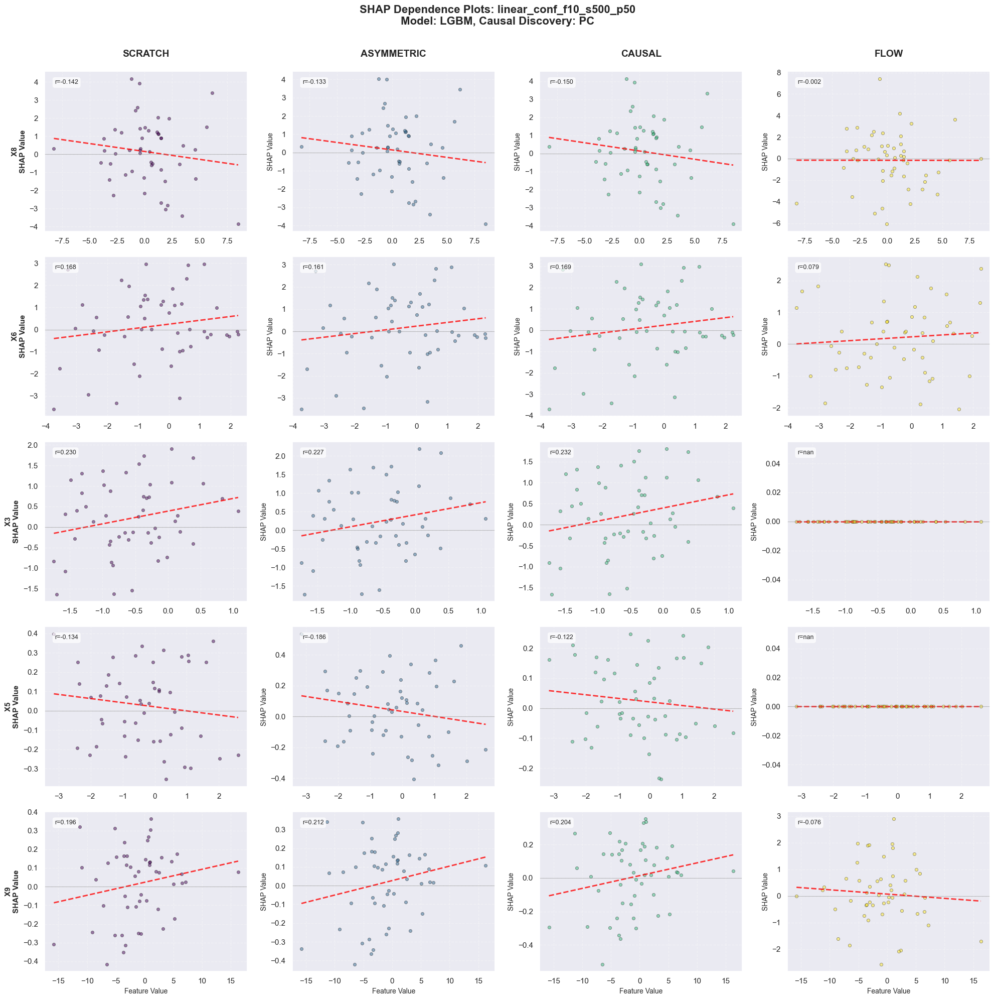


📊 LGBM + LINGAM


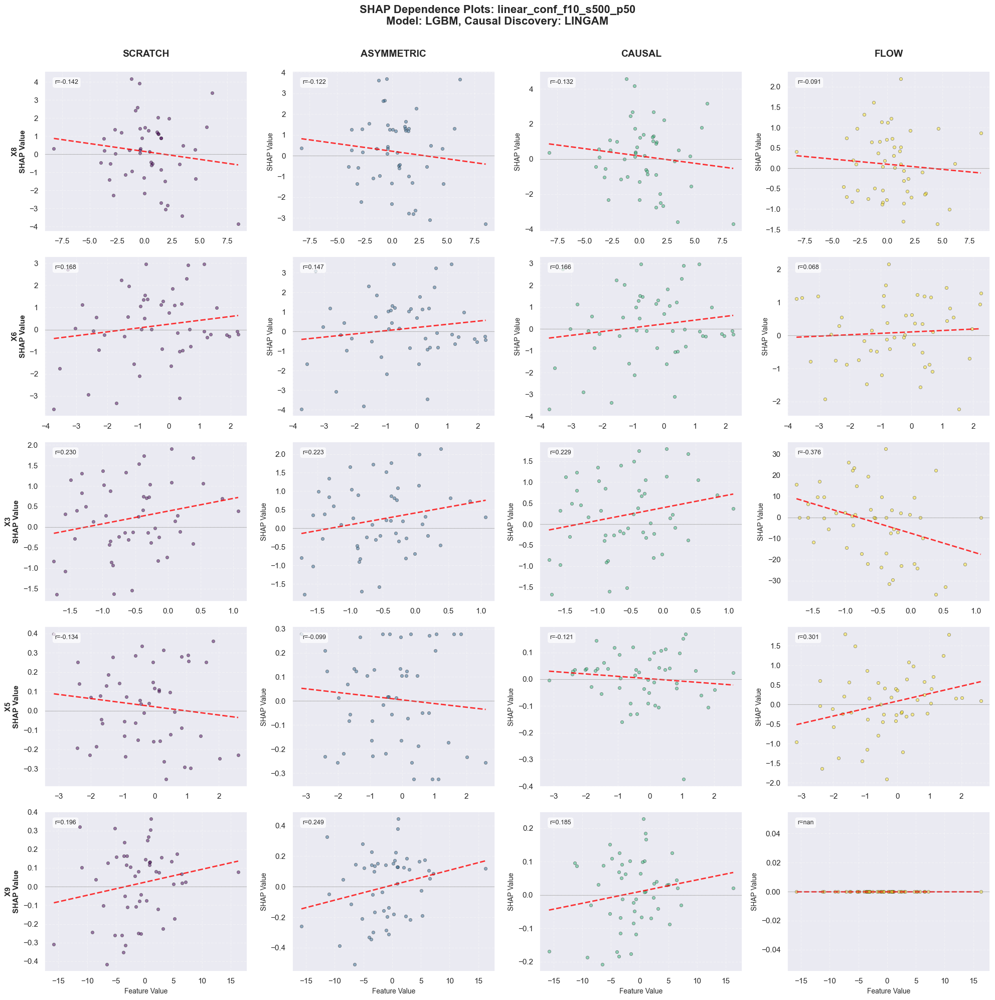


📊 NN + PC


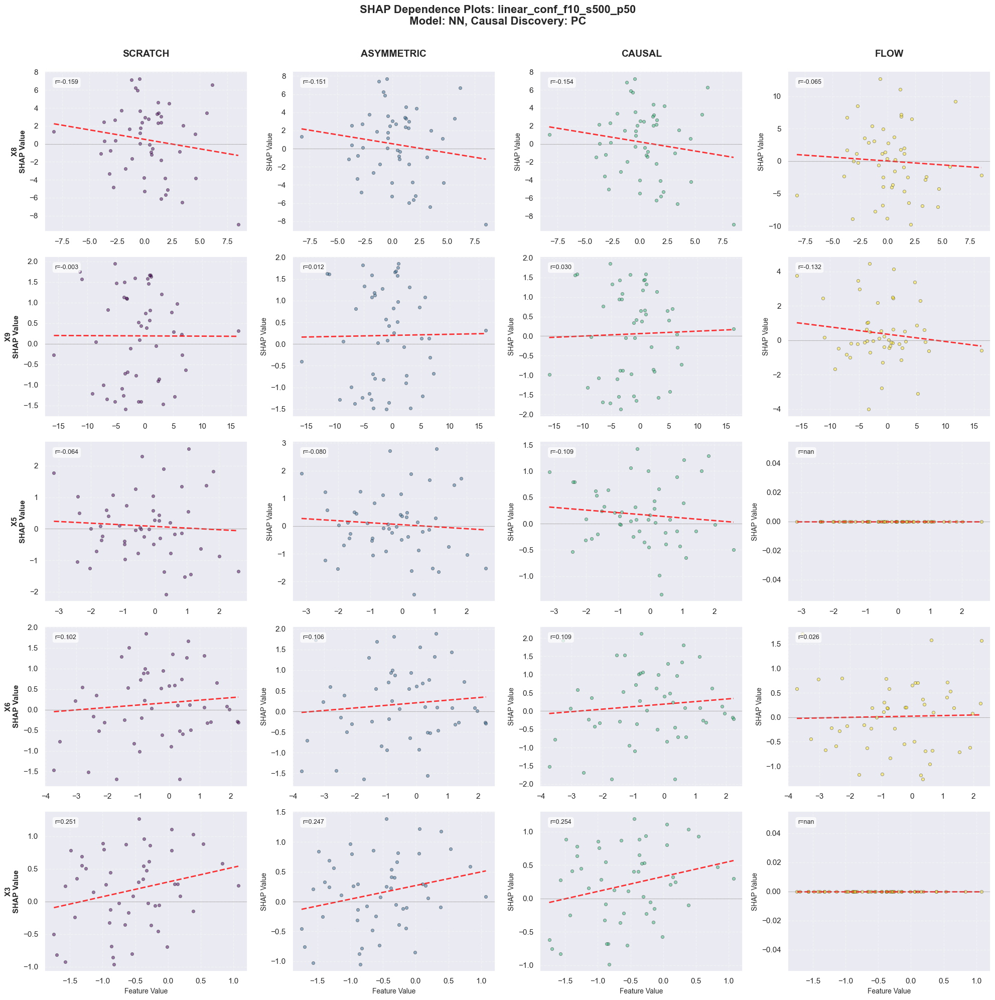


📊 NN + LINGAM


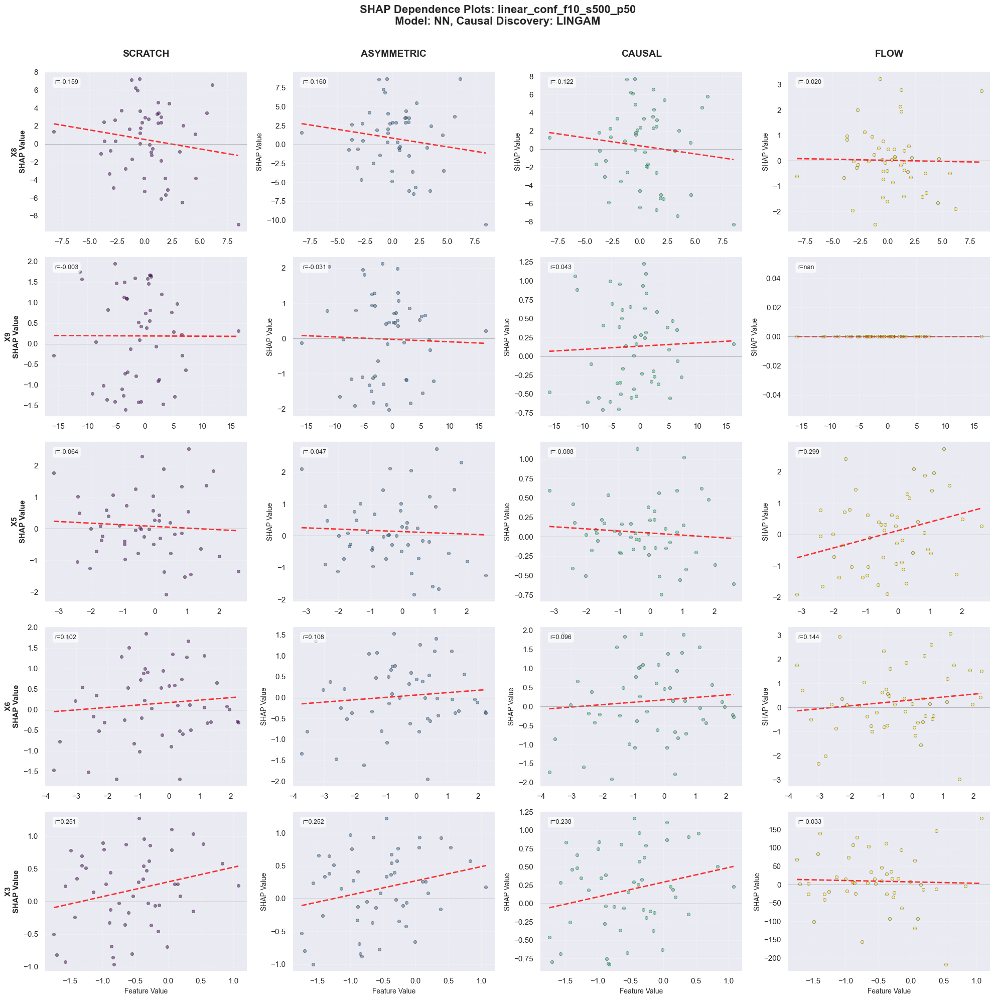


Dataset: nonlinear_no_conf_f10_s500_p50

📊 LGBM + PC


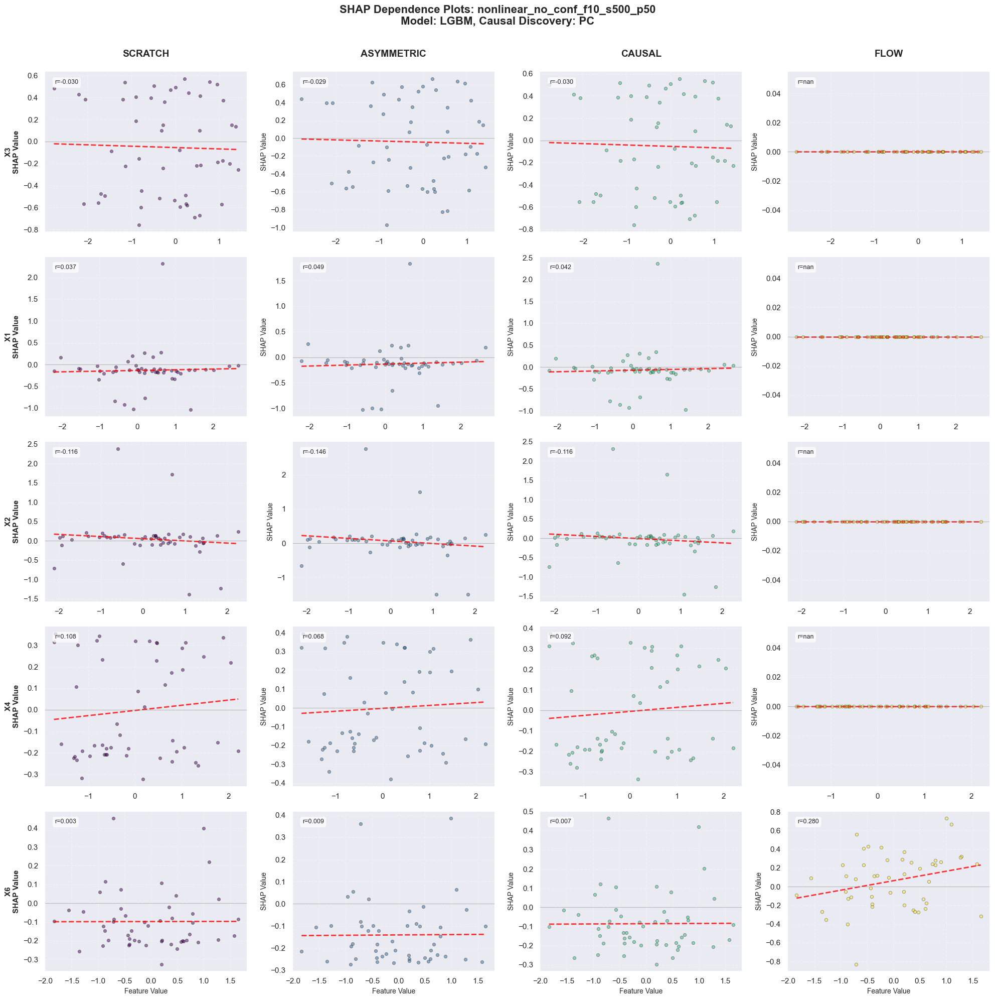


📊 LGBM + LINGAM


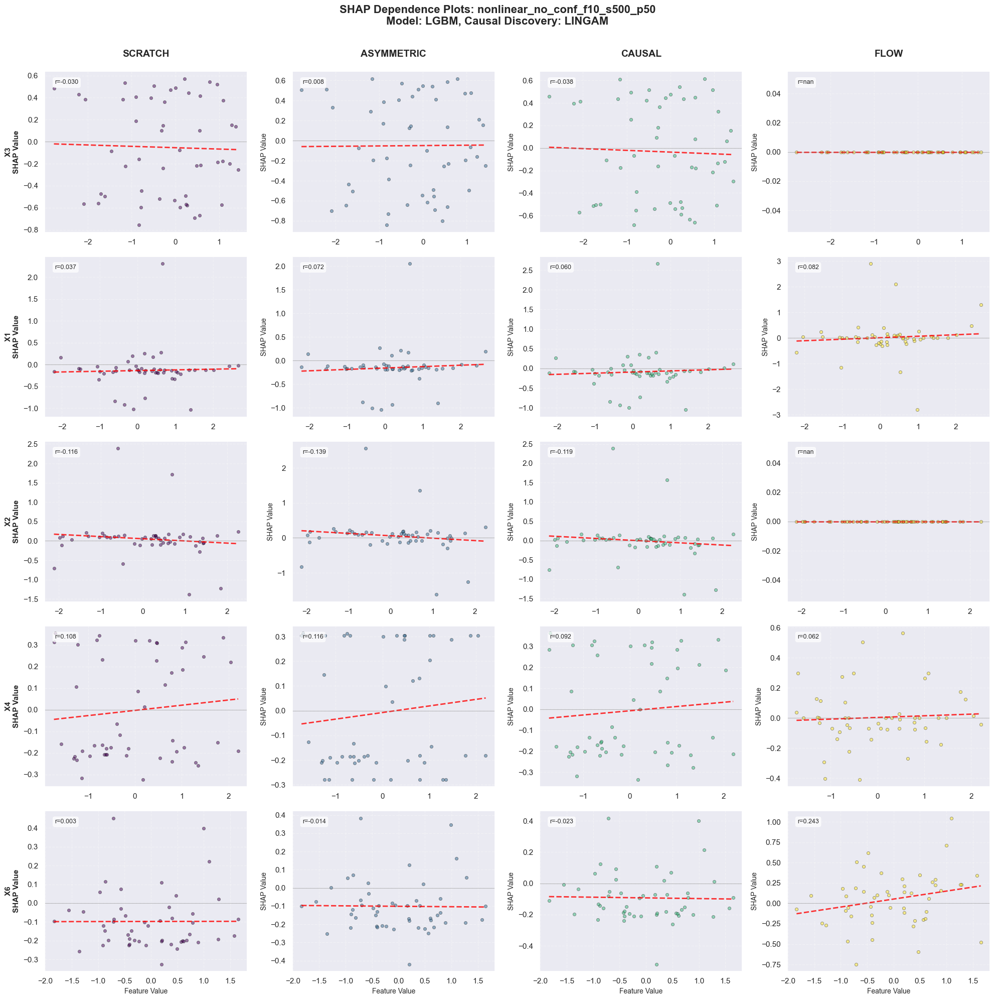


📊 NN + PC


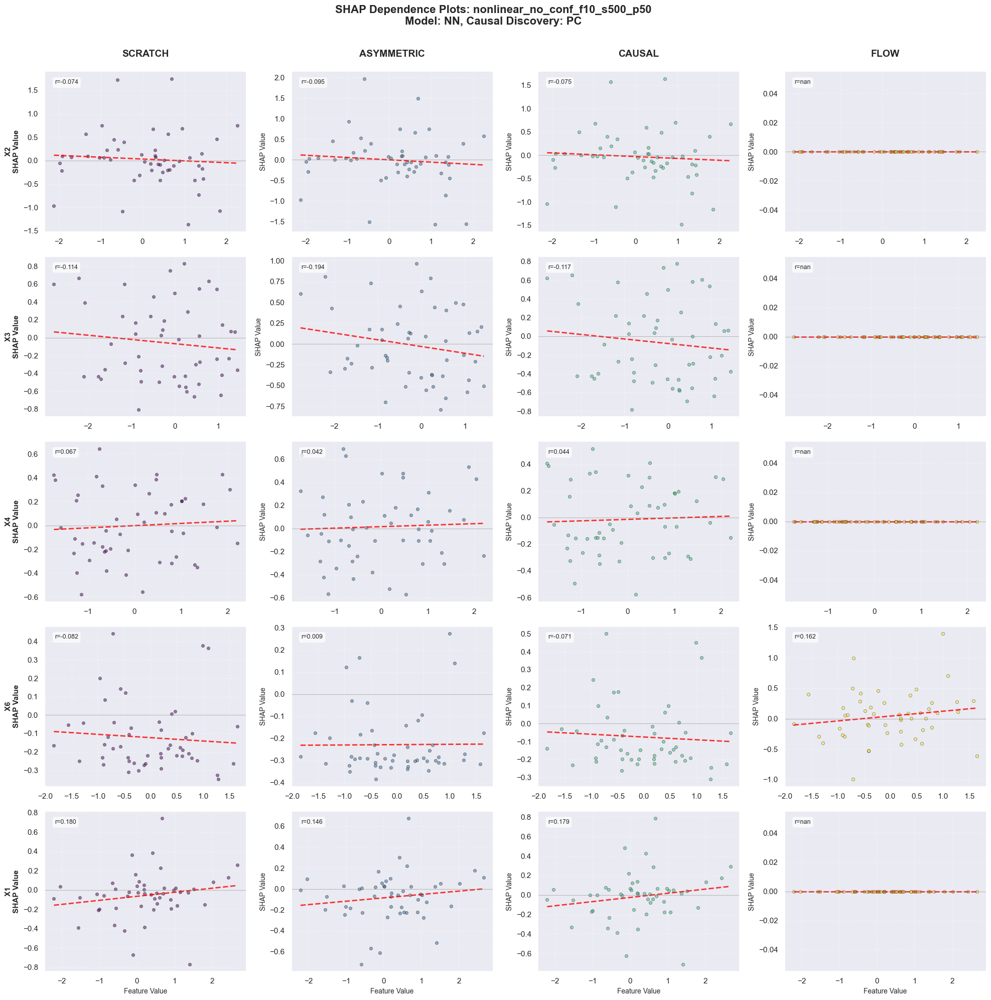


📊 NN + LINGAM


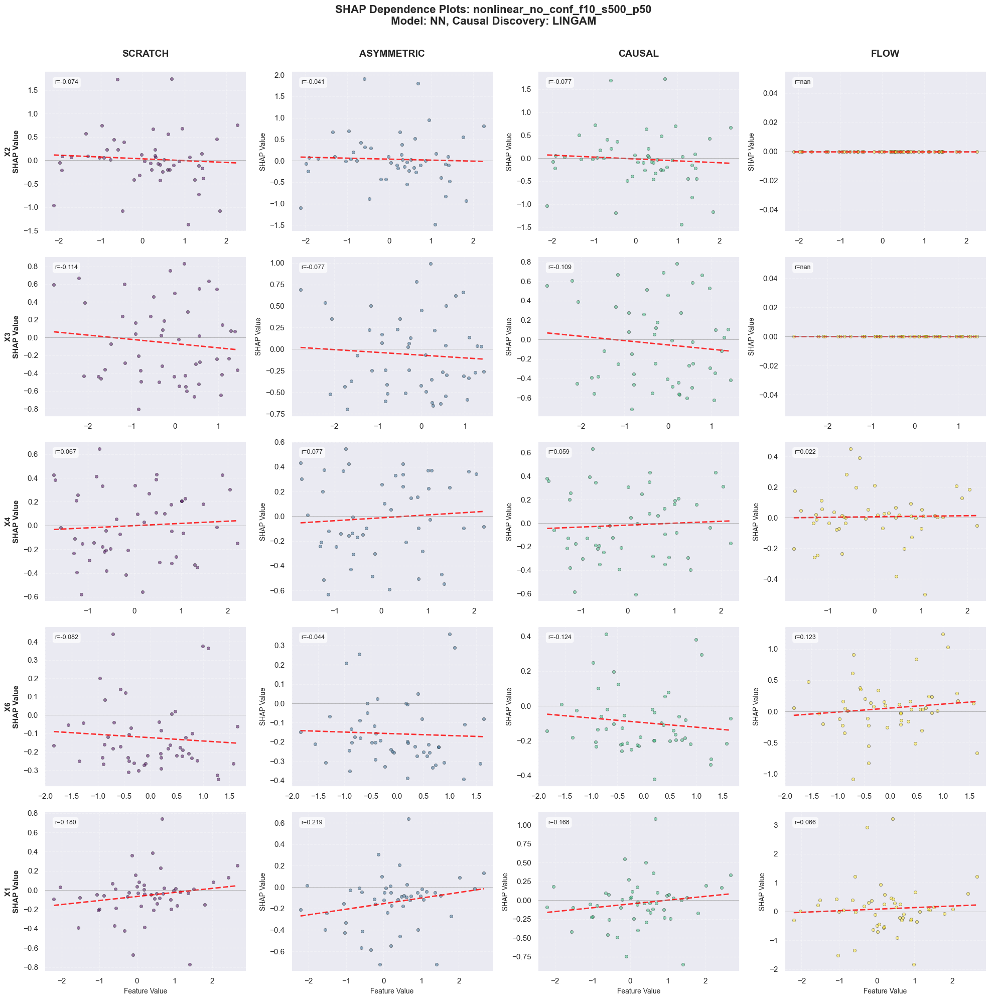


Dataset: nonlinear_conf_f10_s500_p50

📊 LGBM + PC


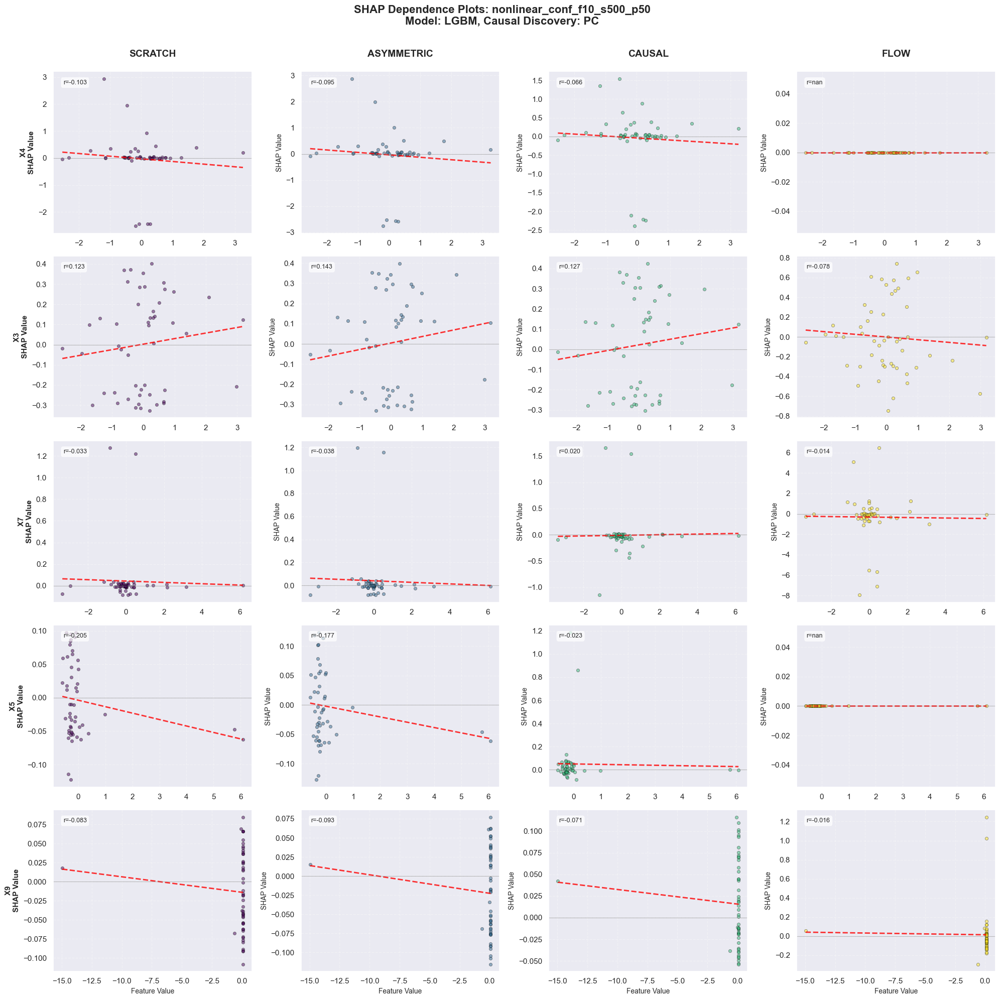


📊 LGBM + LINGAM


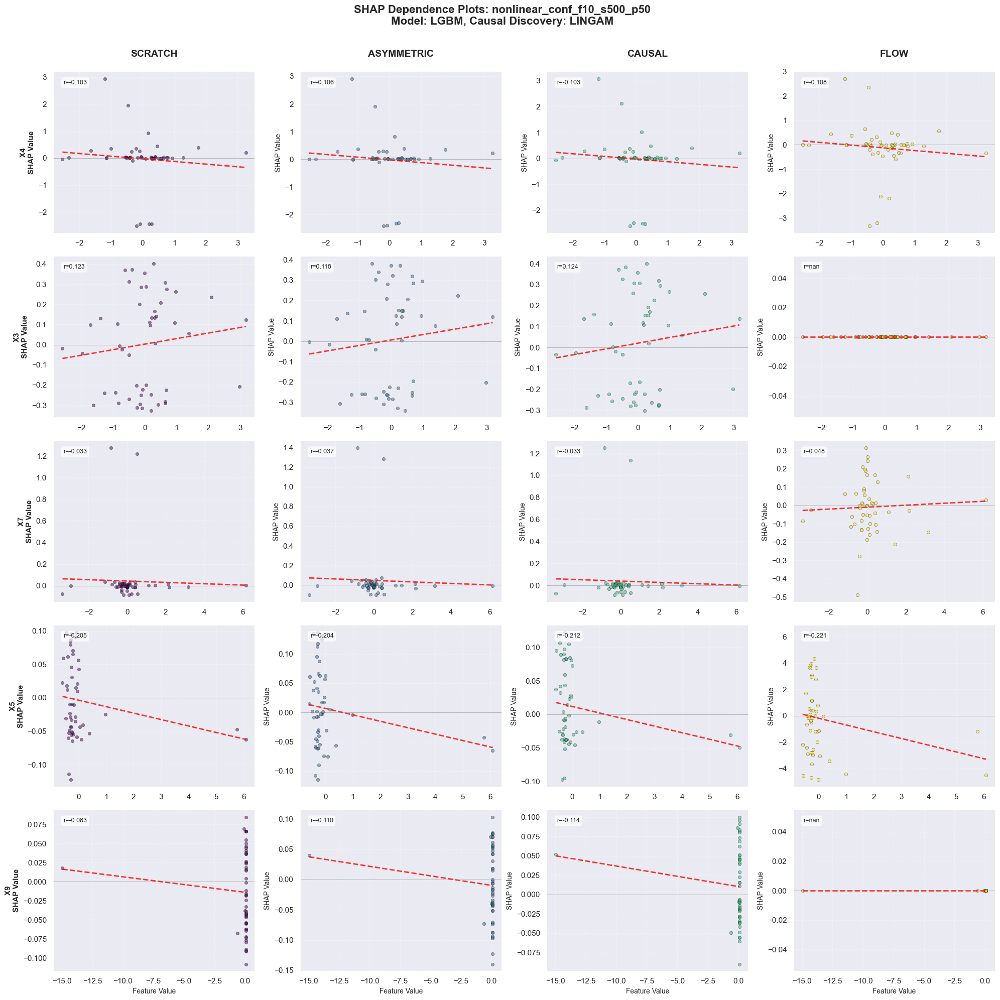


📊 NN + PC


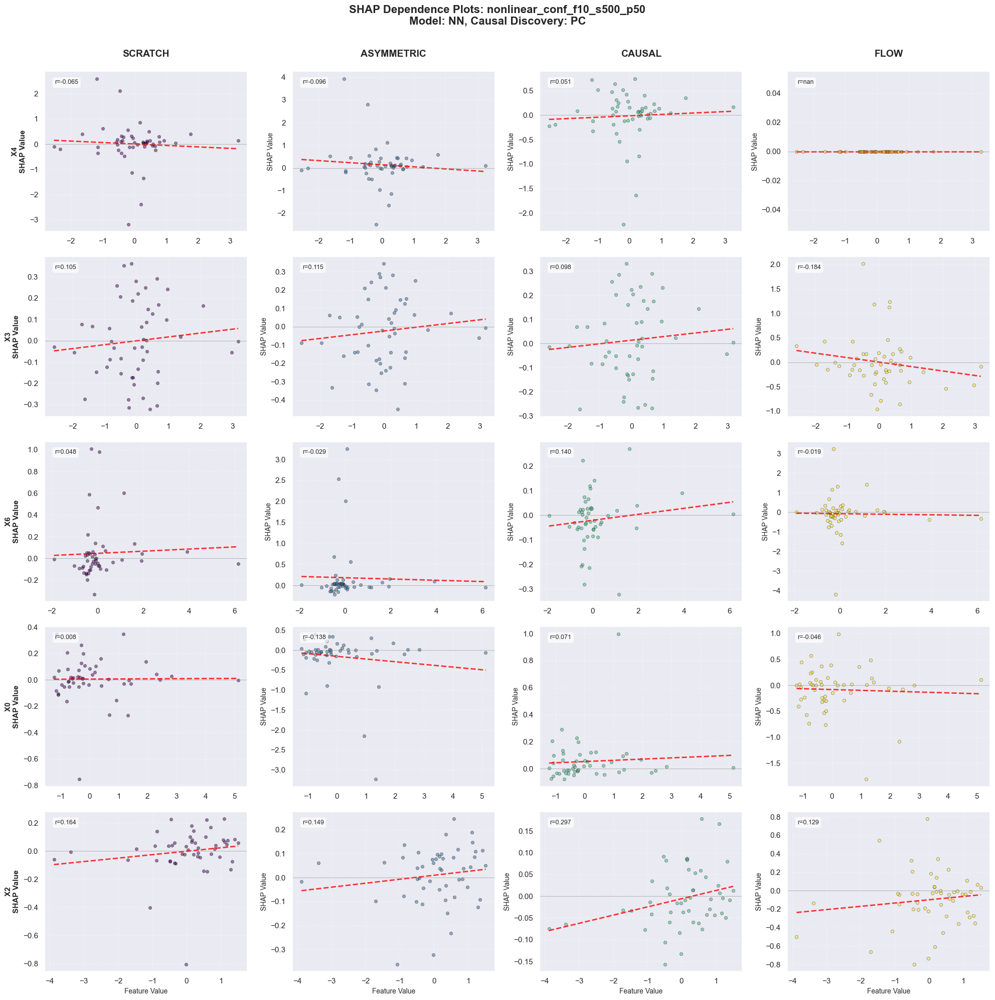


📊 NN + LINGAM


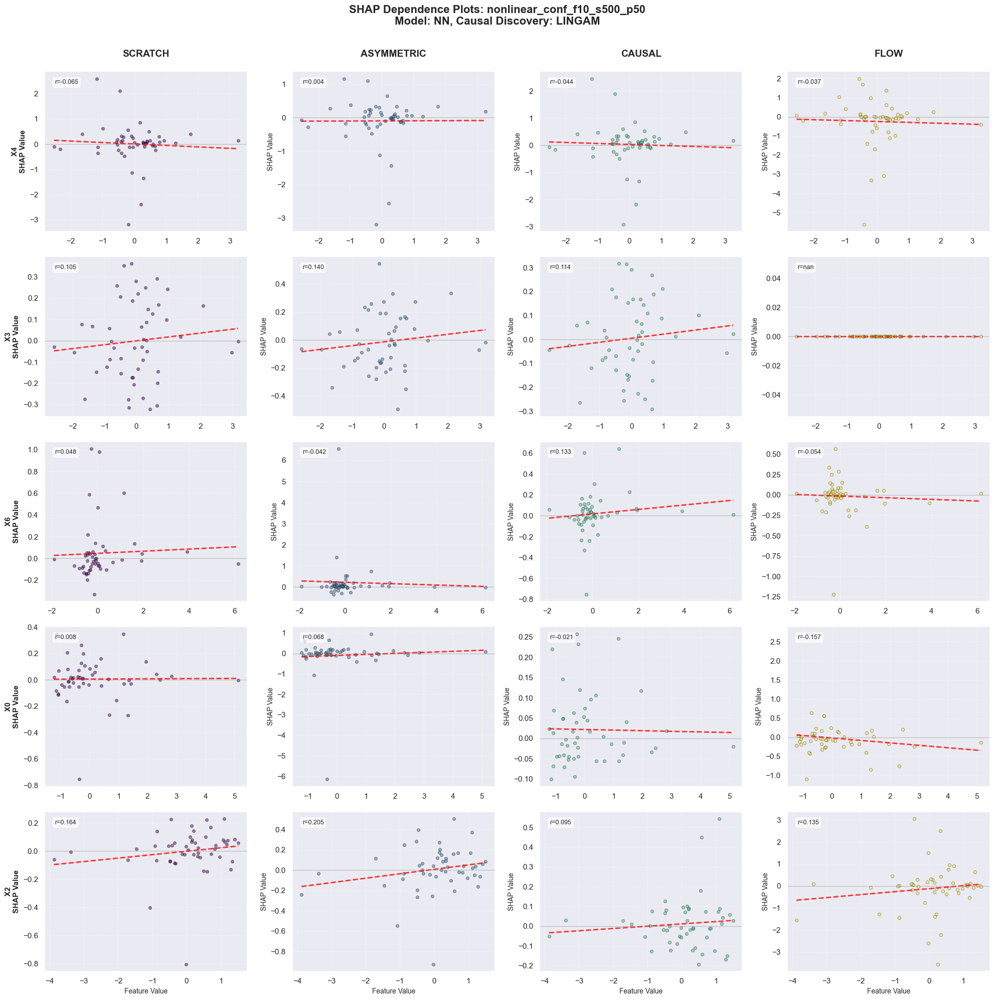


Dataset: mixed_no_conf_f10_s500_p50

📊 LGBM + PC


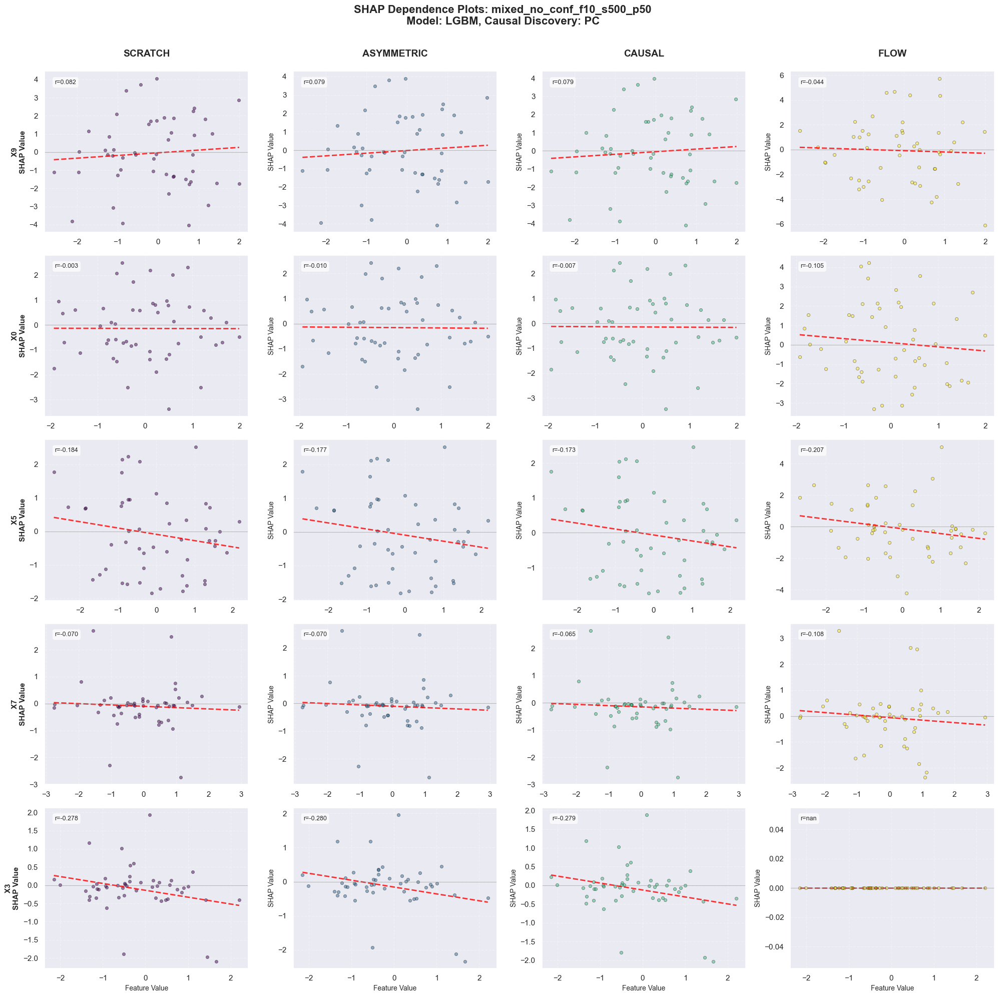


📊 LGBM + LINGAM


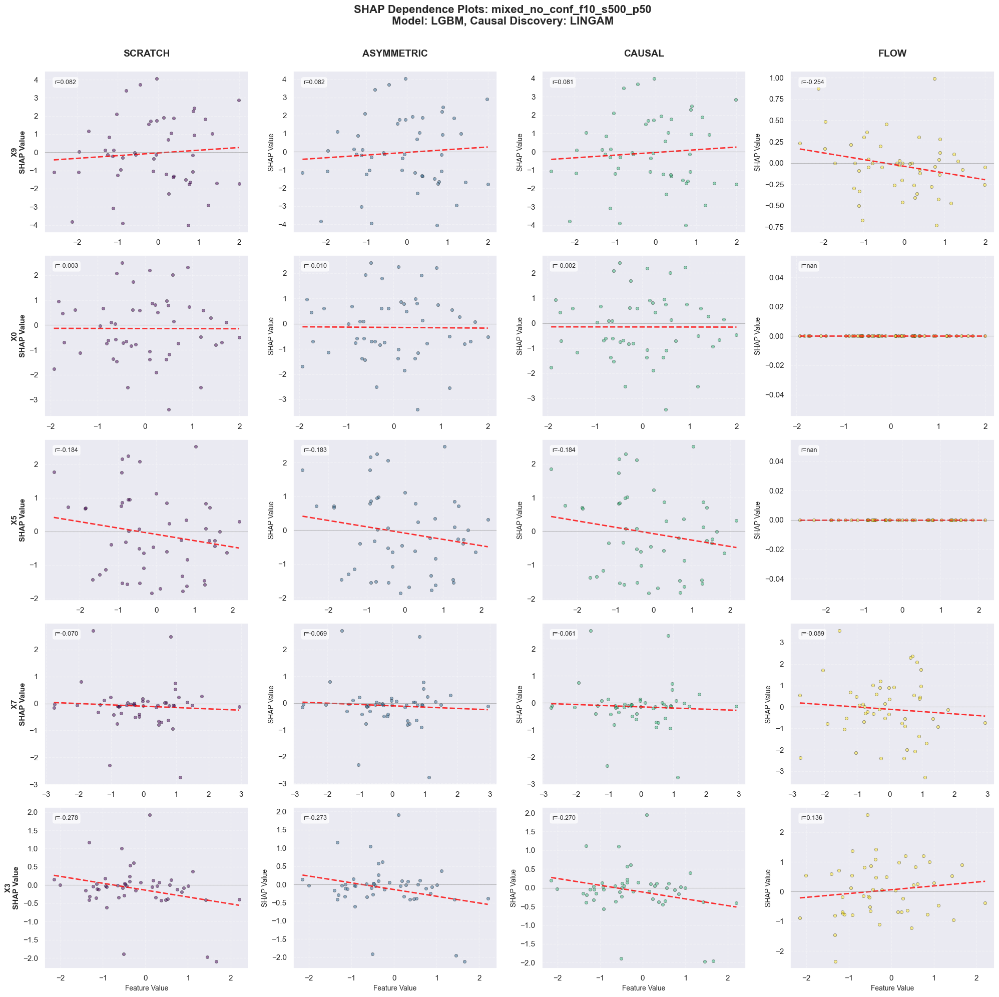


📊 NN + PC


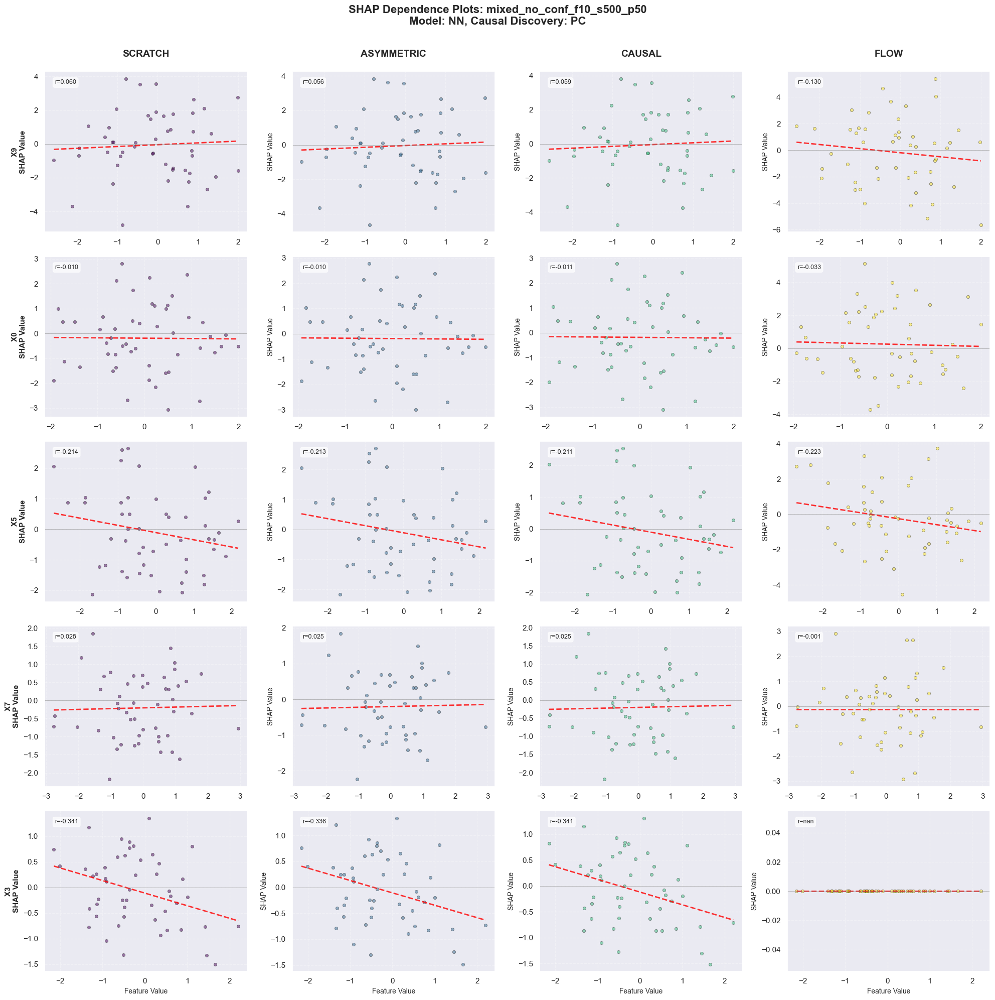


📊 NN + LINGAM


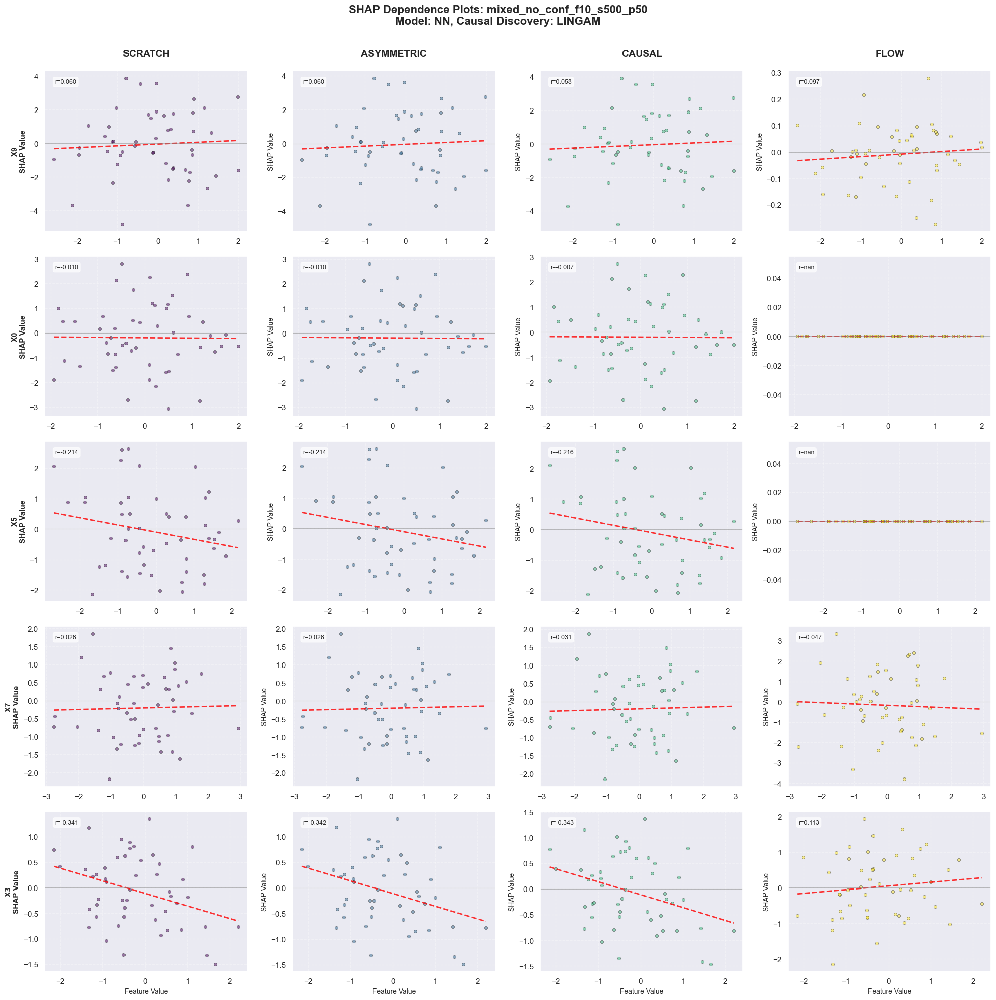


Dataset: mixed_conf_f10_s500_p50

📊 LGBM + PC


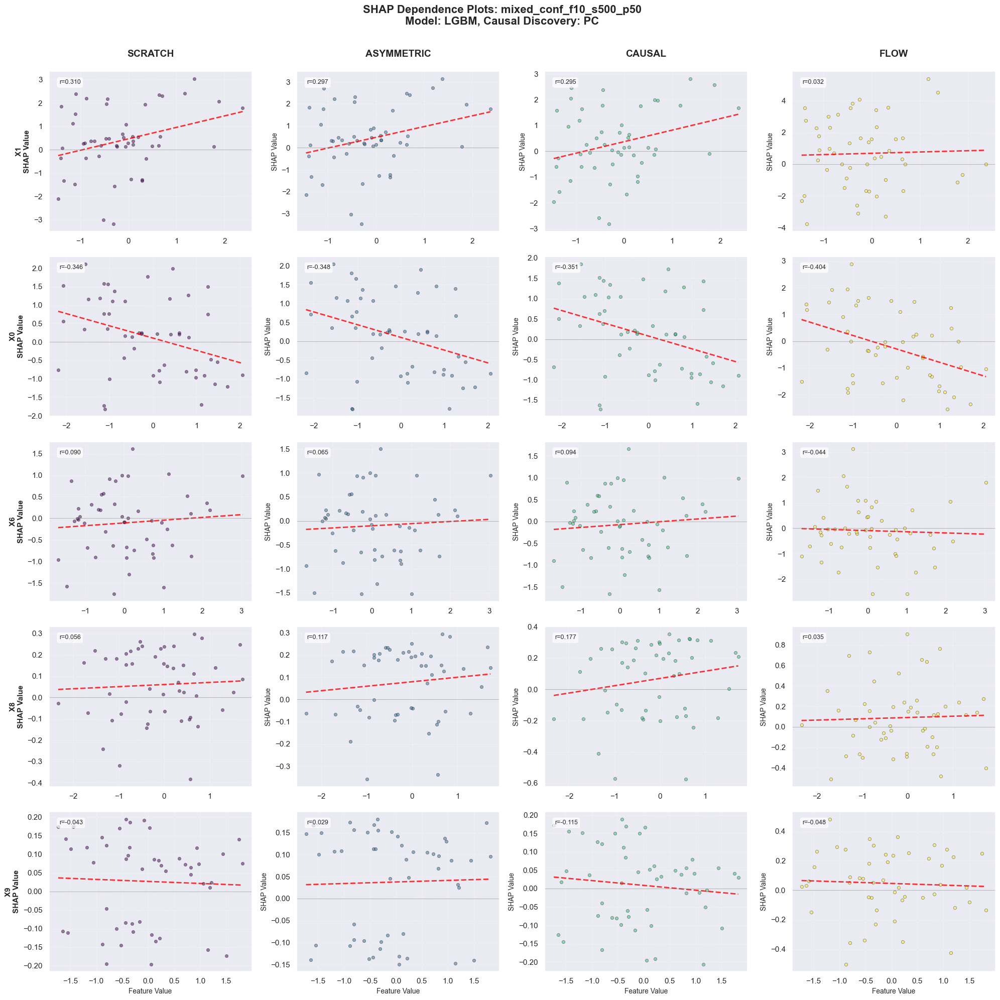


📊 LGBM + LINGAM


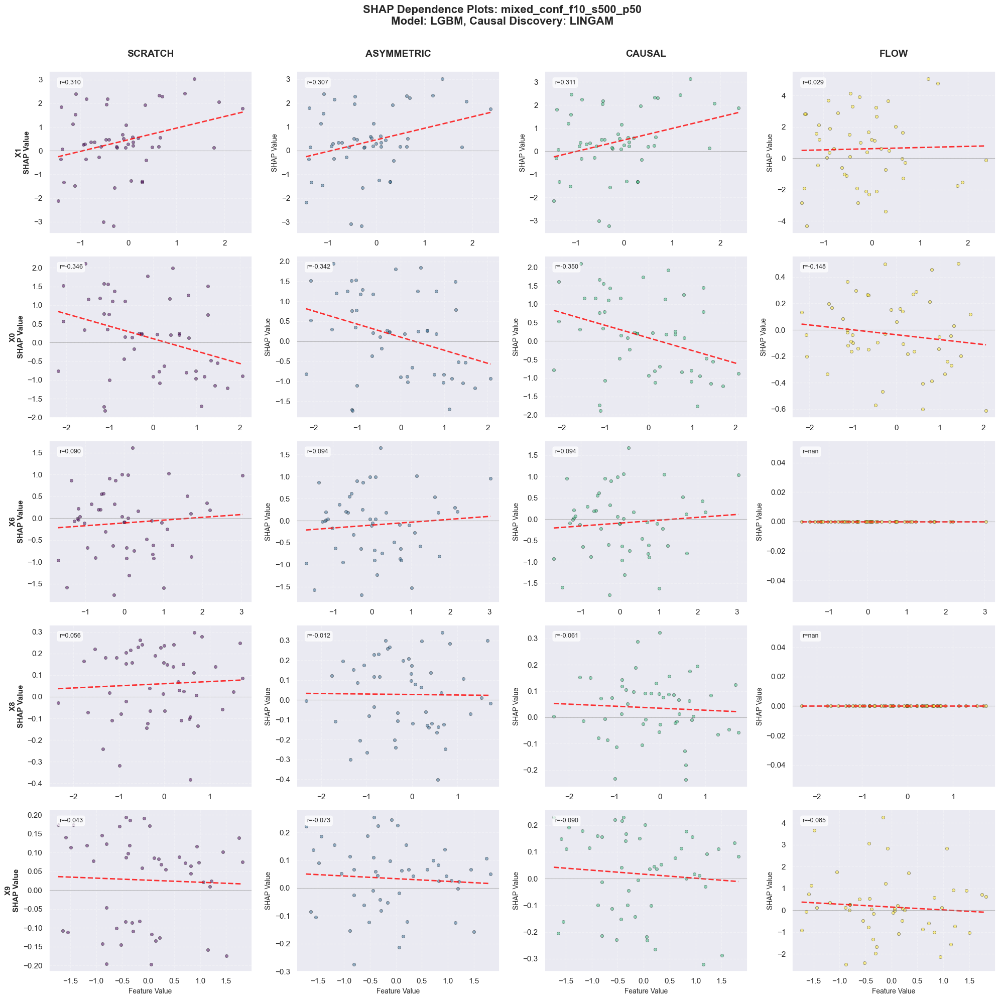


📊 NN + PC


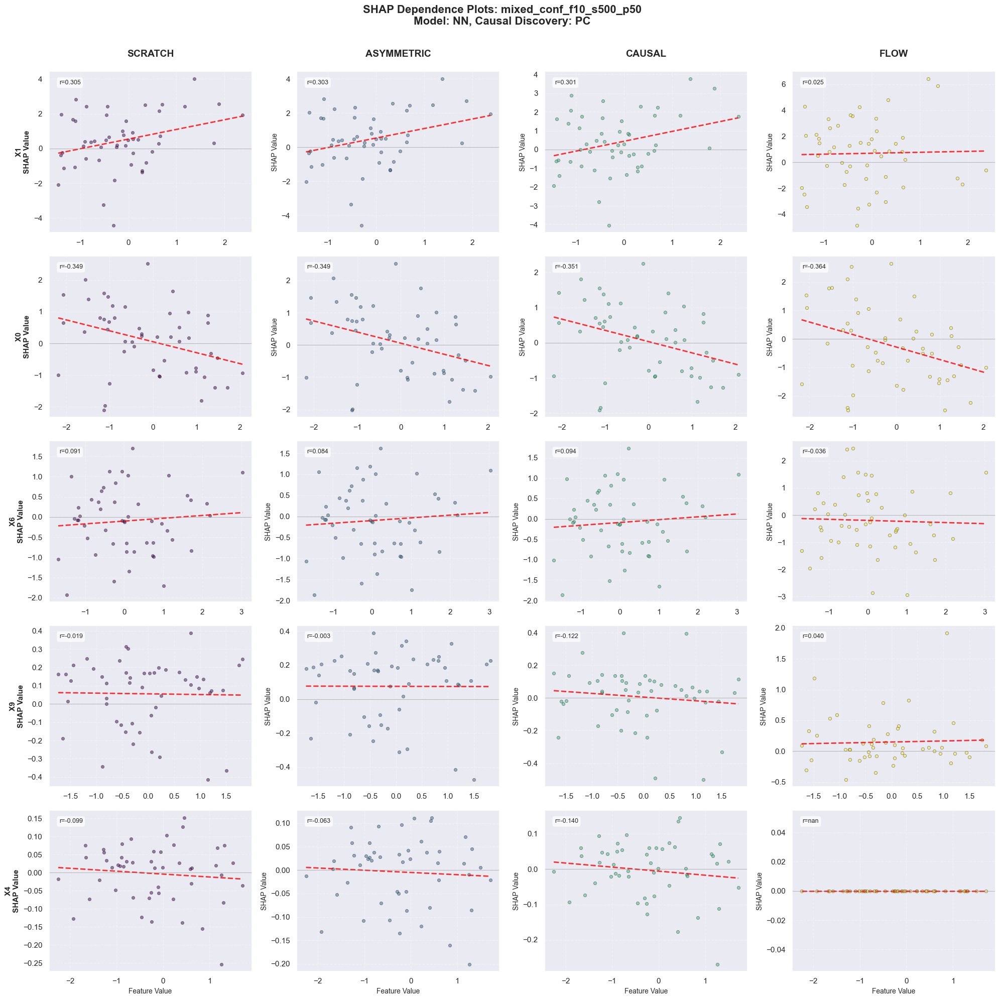


📊 NN + LINGAM


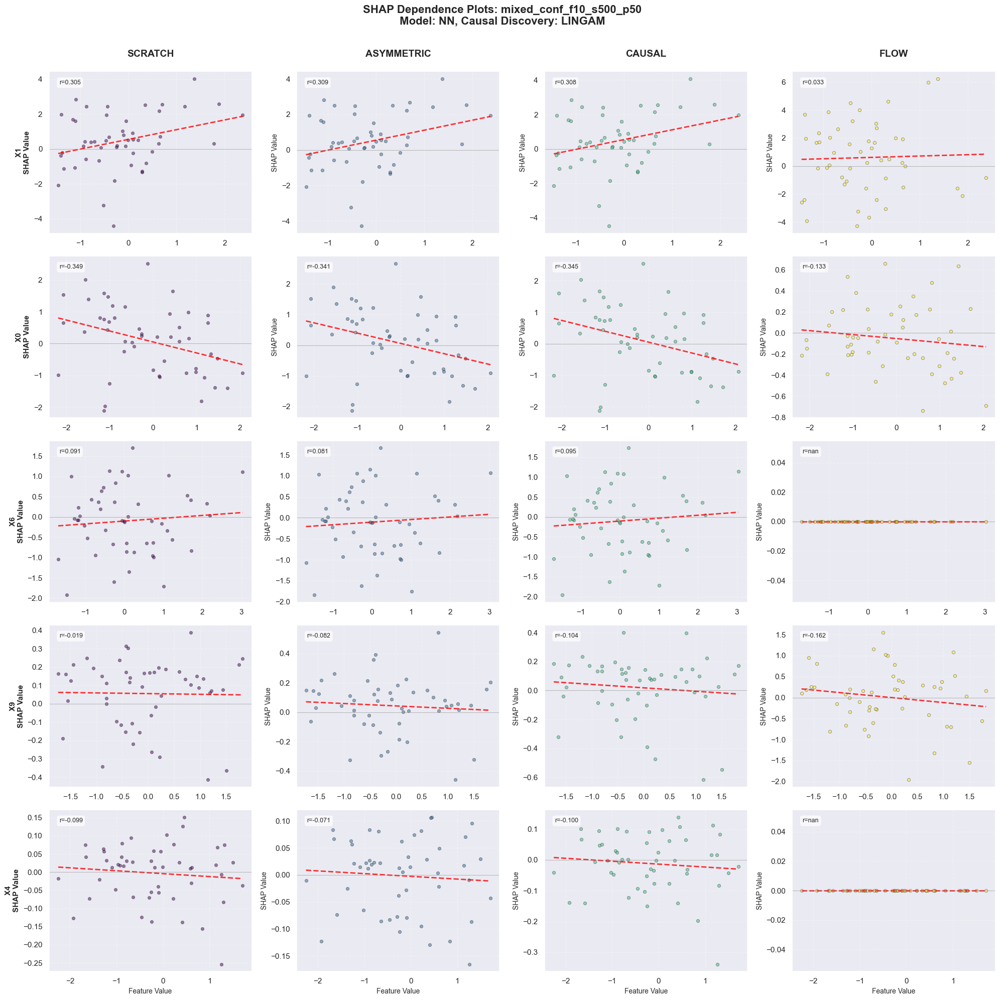

In [15]:
# Generate plots for all datasets, models, and causal discovery methods
for dataset in DATASETS:
    print(f"\n{'='*80}")
    print(f"Dataset: {dataset}")
    print(f"{'='*80}")
    
    for model in PREDICTIVE_MODELS:
        for causal_method in CAUSAL_METHODS:
            print(f"\n📊 {model.upper()} + {causal_method.upper()}")
            try:
                plot_shap_dependence_comparison(
                    dataset=dataset,
                    model=model,
                    causal_discovery_method=causal_method,
                    n_features=5
                )
            except Exception as e:
                print(f"❌ Error: {e}")

---
## 5. Feature Importance Rankings Comparison

Compare how different methods rank feature importance.

In [ ]:
def compare_feature_rankings(dataset, model, causal_discovery_method):
    """
    Compare feature importance rankings across different SHAP methods.
    """
    methods = ['scratch', 'asymmetric', 'causal', 'flow']
    method_paths = {
        'Scratch': EXPLAINABILITY_DIR / dataset / model / 'scratch',
        'Asymmetric': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'asymmetric',
        'Causal': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'causal',
        'Flow': EXPLAINABILITY_DIR / dataset / model / causal_discovery_method / 'flow'
    }
    
    # Load feature importance
    importance_dict = {}
    for method_name, method_path in method_paths.items():
        importance_file = method_path / 'feature_importance.csv'
        if importance_file.exists():
            df = pd.read_csv(importance_file)
            importance_dict[method_name] = df.set_index('feature')['importance']
    
    if not importance_dict:
        print(f"❌ No feature importance found")
        return
    
    # Create comparison dataframe
    comparison_df = pd.DataFrame(importance_dict)
    
    # Plot heatmap
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(comparison_df, annot=True, fmt='.3f', cmap='YlOrRd', 
                cbar_kws={'label': 'Importance'}, ax=ax)
    ax.set_title(f'Feature Importance Comparison\n{dataset} | {model.upper()} | {causal_discovery_method.upper()}',
                fontsize=14, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel('Feature', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return comparison_df

# Example
compare_feature_rankings(
    dataset='linear_no_conf_f10_s1000_p50',
    model='lgbm',
    causal_discovery_method='pc'
)